In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# giải nén ver2
# Tải file
!pip install wget
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar && echo "Tải file thành công!"

# Giải nén file
!tar -xvf VOCtrainval_11-May-2012.tar && echo "Giải nén thành công!"


Streaming output truncated to the last 5000 lines.
VOCdevkit/VOC2012/SegmentationClass/2008_001876.png
VOCdevkit/VOC2012/SegmentationClass/2008_001882.png
VOCdevkit/VOC2012/SegmentationClass/2008_001885.png
VOCdevkit/VOC2012/SegmentationClass/2008_001895.png
VOCdevkit/VOC2012/SegmentationClass/2008_001896.png
VOCdevkit/VOC2012/SegmentationClass/2008_001926.png
VOCdevkit/VOC2012/SegmentationClass/2008_001966.png
VOCdevkit/VOC2012/SegmentationClass/2008_001971.png
VOCdevkit/VOC2012/SegmentationClass/2008_001992.png
VOCdevkit/VOC2012/SegmentationClass/2008_001997.png
VOCdevkit/VOC2012/SegmentationClass/2008_002032.png
VOCdevkit/VOC2012/SegmentationClass/2008_002043.png
VOCdevkit/VOC2012/SegmentationClass/2008_002064.png
VOCdevkit/VOC2012/SegmentationClass/2008_002066.png
VOCdevkit/VOC2012/SegmentationClass/2008_002067.png
VOCdevkit/VOC2012/SegmentationClass/2008_002073.png
VOCdevkit/VOC2012/SegmentationClass/2008_002079.png
VOCdevkit/VOC2012/SegmentationClass/2008_002080.png
VOCdevkit/VOC

In [ ]:
import torch
import torch.nn as nn

architecture_config = [
    (7, 64, 2, 3),
    "M",
    (3, 192, 1, 1),
    "M",
    (1, 128, 1, 0),
    (3, 256, 1, 1),
    (1, 256, 1, 0),
    (3, 512, 1, 1),
    "M",
    [(1, 256, 1, 0), (3, 512, 1, 1), 4],
    (1, 512, 1, 0),
    (3, 1024, 1, 1),
    "M",
    [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
    (3, 1024, 1, 1),
    (3, 1024, 2, 1),
    (3, 1024, 1, 1),
    (3, 1024, 1, 1),
]

class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(CNNBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.batchnorm = nn.BatchNorm2d(out_channels)
        self.leakyrelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))

class Yolov1(nn.Module):
    def __init__(self, in_channels=3, **kwargs):
        super(Yolov1, self).__init__()
        self.architecture = architecture_config
        self.in_channels = in_channels
        self.darknet = self._create_conv_layers(self.architecture)
        self.fcs = self._create_fcs(**kwargs)

    def forward(self, x):
        x = self.darknet(x)
        return self.fcs(torch.flatten(x, start_dim=1)).view(-1, self.S, self.S, self.C + self.B*5)

    def _create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels

        for x in architecture:
            if type(x) == tuple:
                layers += [
                    CNNBlock(
                        in_channels, x[1], kernel_size=x[0], stride=x[2], padding=x[3],
                    )
                ]
                in_channels = x[1]

            elif type(x) == str:
                layers += [nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))]

            elif type(x) == list:
                conv1 = x[0]
                conv2 = x[1]
                num_repeats = x[2]

                for _ in range(num_repeats):
                    layers += [
                        CNNBlock(
                            in_channels,
                            conv1[1],
                            kernel_size=conv1[0],
                            stride=conv1[2],
                            padding=conv1[3],
                        )
                    ]
                    layers += [
                        CNNBlock(
                            conv1[1],
                            conv2[1],
                            kernel_size=conv2[0],
                            stride=conv2[2],
                            padding=conv2[3],
                        )
                    ]
                    in_channels = conv2[1]

        return nn.Sequential(*layers)

    def _create_fcs(self, split_size, num_boxes, num_classes):
        self.S, self.B, self.C = split_size, num_boxes, num_classes

        # In original paper this should be
        # nn.Linear(1024*S*S, 4096),
        # nn.LeakyReLU(0.1),
        # nn.Linear(4096, S*S*(B*5+C))

        return nn.Sequential(
            nn.Flatten(),
            nn.Linear(1024 * self.S * self.S, 4096),
            nn.Dropout(0.0),
            nn.LeakyReLU(0.1),
            nn.Linear(4096, self.S * self.S * (self.C + self.B * 5)),
            nn.Sigmoid()
        )


# đầu ra output = model(img_tensor) -> torch.Size([1, 7, 7, 30])
# [x_center, y_center, w, h, confidence, class_probs_1, class_probs_2, ..., class_probs_C]
# x_center, y_center (tọa độ cục bộ trong cell)


In [ ]:
import torch
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms
import xml.etree.ElementTree as ET
import cv2
import numpy as np

def get_class_dictionary(image_sets_dir):   # name2idx
    classes = []

    # Lấy tất cả các file .txt có tên kết thúc bằng _train.txt
    class_files = [f for f in os.listdir(image_sets_dir) if f.endswith('_train.txt')]

    # Trích xuất tên class từ tên file (bỏ đuôi _train.txt)
    for class_file in sorted(class_files):
        class_name = class_file.replace('_train.txt', '')
        classes.append(class_name)

    # Loại bỏ các file trùng lặp và sắp xếp
    classes = sorted(list(set(classes)))

    # Tạo dictionary với tên class là key và index là value
    class_dict = {class_name: index for index, class_name in enumerate(classes)}

    return class_dict

class PascalVOC2012Dataset(Dataset):
    def __init__(self, root_dir, split='train', S = 7, B = 2, C = 20, transform=None):
        self.root_dir = root_dir
        self.split = split
        self.S = S
        self.B = B
        self.C = C
        self.transform = transform


        # Assuming a typical Pascal VOC directory structure
        img_dir = os.path.join(self.root_dir, 'JPEGImages')
        ann_dir = os.path.join(self.root_dir, 'Annotations')
        imgsets_dir = os.path.join(self.root_dir, 'ImageSets', 'Main')
        split_file = os.path.join(self.root_dir, 'ImageSets', 'Main', f'{self.split}.txt')

        self.class_dict = get_class_dictionary(imgsets_dir)

        # Load image and annotation paths
        self.images = []
        self.annotations = []

        # Read image names from split file
        with open(split_file, 'r') as f:
            image_names = [line.strip() for line in f.readlines()]

        for img_name in image_names:
            img_path = os.path.join(img_dir, f'{img_name}.jpg')
            ann_path = os.path.join(ann_dir, f'{img_name}.xml')

            try:
                # Check if XML is valid
                ET.parse(ann_path)
                self.images.append(img_path)
                self.annotations.append(ann_path)
            except (ET.ParseError, FileNotFoundError) as e:
                print(f"Skipping invalid or missing file: {ann_path} | Error: {e}")


    def __len__(self):
        return len(self.images)


    def _parse_annotation(self, annotation_path):
        label_matrix = torch.zeros(self.S, self.S, 5 * self.B + self.C)

        try:
            anno_info = ET.parse(annotation_path)
            root = anno_info.getroot()
        except ET.ParseError:
            print(f"\nError parsing XML file: {annotation_path}")
            return label_matrix

        # Image size
        size = root.find('size')
        width = int(size.find('width').text)
        height = int(size.find('height').text)


        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_idx = self.class_dict[class_name]

            # Bounding box coordinates
            bbox = obj.find('bndbox')
            xmin = float(bbox.find('xmin').text)
            ymin = float(bbox.find('ymin').text)
            xmax = float(bbox.find('xmax').text)
            ymax = float(bbox.find('ymax').text)

            # Normalize coordinates
            x_center = ((xmin + xmax) / 2) / width
            y_center = ((ymin + ymax) / 2) / height
            box_width = (xmax - xmin) / width
            box_height = (ymax - ymin) / height

            # Determine grid cell
            grid_x = int(x_center * self.S)
            grid_y = int(y_center * self.S)

            # Relative coordinates within grid cell
            x_offset = (x_center * self.S) - grid_x
            y_offset = (y_center * self.S) - grid_y

            # Update label matrix
            if label_matrix[grid_y, grid_x, 4] == 0:  # First box
                label_matrix[grid_y, grid_x, 0:4] = torch.tensor([x_offset, y_offset, box_width, box_height])
                label_matrix[grid_y, grid_x, 4] = 1  # Confidence
                label_matrix[grid_y, grid_x, 5:5+self.C] = torch.zeros(self.C)
                label_matrix[grid_y, grid_x, 10 + class_idx] = 1
            elif label_matrix[grid_y, grid_x, 9] == 0:  # Second box
                label_matrix[grid_y, grid_x, 5:9] = torch.tensor([x_offset, y_offset, box_width, box_height])
                label_matrix[grid_y, grid_x, 9] = 1  # Confidence

        return label_matrix


    def __getitem__(self, index):
        img_path = self.images[index]
        ann_path = self.annotations[index]

        # Load image
        original_image = Image.open(img_path).convert("RGB")  # Đảm bảo ảnh ở định dạng RGB

        if self.transform:
              image_tensor = self.transform(original_image)

        label_matrix = self._parse_annotation(ann_path)

        return original_image, image_tensor, label_matrix


def collate_fn(batch):
    """
    Hàm collate tùy chỉnh cho dataset YOLO

    Args:
    - batch: List các tuple (original_image, image_tensor, label_matrix) từ dataset

    Returns:
    - original_images: List các ảnh gốc
    - images: Tensor batch các ảnh đã transform
    - labels: Tensor batch các nhãn
    """
    # Tách images, tensors và labels từ batch
    original_images, images, labels = zip(*batch)

    # Chuyển thành tensor
    images = torch.stack(images, dim=0)
    labels = torch.stack(labels, dim=0)

    return original_images, images, labels


In [ ]:
import torch
import torch.nn as nn

def local_to_global(box, grid, factor):
    # box  [T, b, 4] [x_cell, y_cell, w, h] -> [x1, y1, x2, y2]
    # grid [T, 2] [x, y]

    grid = grid.unsqueeze(1)

    x = box[..., [0]] * factor + grid[..., [0]]
    y = box[..., [1]] * factor + grid[..., [1]]
    w = box[..., [2]]
    h = box[..., [3]]

    x1 = x - w/2
    y1 = y - h/2
    x2 = x + w/2
    y2 = y + h/2

    return torch.cat([x1, y1, x2, y2], dim=-1)

def compute_iou(pred_bboxes, truth_bboxes, split_size=7, batch=1):
    S = split_size
    factor       = 1. / S

    # tạo grid
    coor   = torch.arange(0, 1., factor).to('cuda')
    coor_y, coor_x   = torch.meshgrid([coor, coor], indexing='ij')

    grid = torch.stack([coor_x, coor_y], dim=-1).view(-1, 2)
    grid = grid.unsqueeze(0).unsqueeze(0).repeat([batch, 1, 1, 1])
    grid = grid.view(-1, 2)

    # [T, bb, 4]
    pred_bboxes  = local_to_global(pred_bboxes, grid, factor)
    truth_bboxes = local_to_global(truth_bboxes, grid, factor)

    # [T, 1, 1, 4]
    truth_bboxes = truth_bboxes[:, [0], :].unsqueeze(2)
    na = truth_bboxes.shape[1]
    # [T, 1, 2, 4]
    pred_bboxes  = pred_bboxes.unsqueeze(1)
    nb = pred_bboxes.shape[2]

    truth_bboxes = truth_bboxes.repeat([1, 1, nb, 1])

    x1_truth = truth_bboxes[..., [0]]
    y1_truth = truth_bboxes[..., [1]]
    x2_truth = truth_bboxes[..., [2]]
    y2_truth = truth_bboxes[..., [3]]

    x1_pred = pred_bboxes[..., [0]]
    y1_pred = pred_bboxes[..., [1]]
    x2_pred = pred_bboxes[..., [2]]
    y2_pred = pred_bboxes[..., [3]]


    #print(x1_truth.shape)
    #print(x1_pred.shape)

    x1_max = torch.max(x1_truth, x1_pred)
    y1_max = torch.max(y1_truth, y1_pred)
    x2_min = torch.min(x2_truth, x2_pred)
    y2_min = torch.min(y2_truth, y2_pred)

    w = (x2_min - x1_max).clamp(0)
    h = (y2_min - y1_max).clamp(0)

    intersect = w*h

    area_a = (y2_truth - y1_truth) * (x2_truth - x1_truth)
    area_b = (y2_pred - y1_pred) * (x2_pred - x1_pred)

    union = area_a + area_b - intersect

    return intersect / union

class YOLOv1Loss(nn.Module):
    def __init__(self, S = 7, B = 2, C = 20):
        super(YOLOv1Loss, self).__init__()
        self.S = S
        self.B = B
        self.C = C
        self.lambda_coord = 5
        self.lambda_noobj = 0.5
        self.eps = 1e-8
        self.mse = nn.MSELoss(reduction='sum')

    def __call__(self, predict,  truth):
        # predict [Batch, S, S, (20 + B*5)] [8, 7, 7, 30]
        # truth    same

        batch = predict.shape[0]

        # C + B*5
        N = predict.shape[-1]

        # [T, N]
        predict = predict.view(-1, N)
        truth   = truth.view(-1, N)

        # [T, 1]
        obj_mask   = (truth[..., 4] == 1)
        noobj_mask = (truth[..., 4] == 0)

        pred_bboxes  = []
        truth_bboxes = []
        pred_conf    = []
        for b in range(self.B):
            pred_bboxes.append(predict[..., b*5:b*5+4])
            truth_bboxes.append(truth[..., b*5:b*5+4])
            pred_conf.append(predict[..., b*5+4])

        # [T, 2, 4]
        pred_bboxes  = torch.stack(pred_bboxes, dim=1) # [Batch * S * S, B, 4]
        pred_conf    = torch.stack(pred_conf, dim=1) # [Batch * S * S, B]
        truth_bboxes = torch.stack(truth_bboxes, dim=1) # [Batch * S * S, B, 4]
        #print(truth_bboxes[obj_mask])
        #sys.exit()

        with torch.no_grad():
            iou = compute_iou(pred_bboxes, truth_bboxes, self.S, batch) # [Batch * S * S, B]
            iou = iou.squeeze(-1) #

        # [392, 1], [392, 1]
        max_val_iou, max_idx_iou = torch.max(iou, dim=-1)
        max_val_iou.squeeze_(-1)
        max_idx_iou.squeeze_(-1)
        #print(pred_bboxes.shape, pred_conf.shape)
        #print(max_val_iou.shape, max_idx_iou.shape)

        tt = torch.arange(pred_bboxes.shape[0])

        pred_bboxes = pred_bboxes[tt, max_idx_iou]
        pred_conf   = pred_conf[tt, max_idx_iou]
        pred_cls    = predict[..., 5*self.B:]
        #print(pred_bboxes.shape)
        #sys.exit()

        truth_bboxes = truth_bboxes[tt, max_idx_iou]
        truth_cls    = truth[..., self.B * 5:]

        term1 = self.mse(pred_bboxes[obj_mask][:, 0], truth_bboxes[obj_mask][:, 0]) + self.mse(pred_bboxes[obj_mask][:, 1], truth_bboxes[obj_mask][:, 1])

        term2 = (
            self.mse(torch.sqrt(pred_bboxes[obj_mask][:, 2] + self.eps), torch.sqrt(truth_bboxes[obj_mask][:, 2] + self.eps)) +
            self.mse(torch.sqrt(pred_bboxes[obj_mask][:, 3] + self.eps), torch.sqrt(truth_bboxes[obj_mask][:, 3] + self.eps))
        )

        term3 = self.mse(pred_conf[obj_mask], max_val_iou[obj_mask])

        term4 = self.mse(pred_conf[noobj_mask], torch.zeros_like(pred_conf[noobj_mask]))

        term5 = self.mse(pred_cls[obj_mask], truth_cls[obj_mask])

        # print(pred_bboxes[obj_mask][:, 0])
        # print(pred_bboxes[obj_mask][:, 1])
        # print(pred_bboxes[obj_mask][:, 2])
        # print(pred_bboxes[obj_mask][:, 3])
        # print('#################')
        # print(truth_bboxes[obj_mask][:, 0])
        # print(truth_bboxes[obj_mask][:, 1])
        # print(truth_bboxes[obj_mask][:, 2])
        # print(truth_bboxes[obj_mask][:, 3])

        loss = self.lambda_coord * (term1 + term2) + term3 + self.lambda_noobj * term4 + term5
        loss /= batch
        #print(loss.item())
        #print(obj_mask.sum())
        return loss


In [ ]:
import torch
from tqdm import tqdm
import os
#from loss import compute_iou
from collections import Counter

def convert_to_boxes(tensor, is_prediction=True):
    """
    Convert tensor predictions/targets to bounding box format.

    Args:
        tensor (Tensor): Predictions or targets [B, S, S, 5 + C].
        is_prediction (bool): Whether the input is predictions or targets.

    Returns:
        list: List of bounding boxes in the format
            [x_center, y_center, width, height, conf, class_probs...] for predictions
            [x_center, y_center, width, height, label] for targets.
    """
    B, S, S, _ = tensor.shape
    boxes = []
    tensor = tensor.cpu()

    for b in range(B):
        for i in range(S):
            for j in range(S):
                cell = tensor[b, i, j]
                if is_prediction:
                    for k in range(2):  # B (number of bounding boxes per cell)
                        conf = cell[4 + k * 5]
                        if conf > 0.5:  # Confidence threshold
                            x_center = (cell[k * 5] + j) / S
                            y_center = (cell[k * 5 + 1] + i) / S
                            width = cell[k * 5 + 2]
                            height = cell[k * 5 + 3]
                            class_probs = cell[10:]
                            boxes.append([x_center, y_center, width, height, conf, *class_probs])
                else:
                    if cell[4] > 0:  # Objectness score > 0
                        x_center = (cell[0] + j) / S
                        y_center = (cell[1] + i) / S
                        width = cell[2]
                        height = cell[3]
                        label = torch.argmax(cell[5:]).item()
                        boxes.append([x_center, y_center, width, height, label])

    return boxes


def train_model(model, dataloader, criterion, optimizer, device, epoch):
    """
    Training function for one epoch

    Args:
        model (nn.Module): YOLOv1 model
        dataloader (DataLoader): Training data loader
        criterion (nn.Module): Loss function
        optimizer (torch.optim): Optimizer
        device (torch.device): Computing device
        epoch (int): Current epoch number

    Returns:
        float: Average training loss for the epoch
    """
    model.train()
    total_loss = 0.0
    progress_bar = tqdm(
        dataloader,
        desc='Training',
        unit='batch'
    )


    for batch_idx,(_, images, targets) in enumerate(progress_bar):
        # print(f"Processing train - batch [{batch_idx + 1}/{len(dataloader)}]")
        # Move to device
        images = images.to(device)
        targets = targets.to(device)

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass
        predictions = model(images)

        # Compute loss
        loss = criterion(predictions, targets)

        # Backward pass
        loss.backward()

        # Optimize
        optimizer.step()

        # Update metrics
        total_loss += loss.item()
        progress_bar.set_postfix({'Loss': loss.item()})

    # Return average loss for the epoch
    return total_loss / len(dataloader)


def validate_model(model, dataloader, criterion, device):
    """
    Validation function

    Args:
        model (nn.Module): YOLOv1 model
        dataloader (DataLoader): Validation data loader
        criterion (nn.Module): Loss function
        device (torch.device): Computing device

    Returns:
        float: Average validation loss
    """
    model.eval()
    total_loss = 0.0
    all_pred_boxes = []
    all_truth_boxes = []

    # Disable gradient computation for validation
    with torch.no_grad():
        progress_bar = tqdm(
            dataloader,
            desc='Validation',
            unit='batch'
        )

        for batch_idx,(_,images, targets) in enumerate(progress_bar):
            # print(f"Processin eval batch [{batch_idx + 1}/{len(dataloader)}]")
            # Move to device
            images = images.to(device)
            targets = targets.to(device)

            # Forward pass
            predictions = model(images)

            # Compute loss
            loss = criterion(predictions, targets)

            # Update metrics
            total_loss += loss.item()

            # Chuyển đổi predictions và targets thành danh sách bounding box
            batch_pred_boxes = convert_to_boxes(predictions)
            batch_truth_boxes = convert_to_boxes(targets, is_prediction=False)

            all_pred_boxes.extend(batch_pred_boxes)
            all_truth_boxes.extend(batch_truth_boxes)

            progress_bar.set_postfix({'Loss': loss.item()})

        mAP_score = mean_average_precision(
            all_pred_boxes,
            all_truth_boxes
        )

    # Return average validation loss and mAP
    return total_loss / len(dataloader), mAP_score

def save_checkpoint(model, optimizer, epoch, mAP, loss, filepath="checkpoint.pth", weights_only=False):
    """
    Save checkpoint to a file.

    Args:
        model (nn.Module): Model instance to save.
        optimizer (torch.optim.Optimizer): Optimizer instance to save.
        epoch (int): Current epoch number.
        loss (float): Current loss value.
        mAP (float): Current mAP value.
        filepath (str): Path to save the checkpoint file.
        weights_only (bool): If True, only save model weights. Default is False.
    """

    try:
        if weights_only:
            checkpoint = {
                "model_state_dict" : model.state_dict(),
            }
        else:
            checkpoint = {
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "epoch": epoch,
                "mAP": mAP,
                "loss" : loss
            }
            
        torch.save(checkpoint, filepath)
        print(f"Checkpoint saved at [{filepath}]")
    except Exception as e:
        print(f"Failed to save checkpoint at [{filepath}]. Error: {e}")


def load_checkpoint(filepath, model, optimizer=None, device="cpu", load_weights_only=False):
    """
    Load checkpoint
    Args:
        filepath (str): Path to the checkpoint file.
        model (nn.Module): Model instance to load weights into.
        optimizer (torch.optim.Optimizer, optional): Optimizer instance to load states into. Default is None.
        device (str or torch.device): Device to load checkpoint to (e.g., "cpu" or "cuda").
        load_weights_only (bool): Whether to load only the model weights. Default is False.

    Returns:
        model (nn.Module): Model with loaded weights.
        optimizer (torch.optim.Optimizer or None): Optimizer with loaded states if load_weights_only=False.
        start_epoch (int): Starting epoch if load_weights_only=False.
        loss (float or None): Loss value if load_weights_only=False.
        mAP (float or None): mAP value if load_weights_only=False.
    """

    if not os.path.exists(filepath):
        raise FileNotFoundError(f"Checkpoint file not found at {filepath}")

    print(f"Loading checkpoint from [{filepath}]...")
    checkpoint = torch.load(filepath, map_location=device) # mặc định sẽ load toàn bộ model

    # Load model weights
    model.load_state_dict(checkpoint["model_state_dict"])
    print("Model weights loaded.")

    if not load_weights_only: # khi load_weight_only = False thì sẽ load toàn bộ
        if optimizer is not None and "optimizer_state_dict" in checkpoint:
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            print("Optimizer state loaded.")

        start_epoch = checkpoint.get("epoch", 0)
        # loss = checkpoint.get("loss", float("inf"))
        mAP = checkpoint.get("mAP", 0.0)
        loss = checkpoint.get("loss", float('inf'))
        return model, optimizer, start_epoch, mAP, loss

    return model, None, 0, None, None # trả về thông số model khi load_weight_only = True
def mean_average_precision(pred_boxes, true_boxes, iou_threshold=0.5, num_classes=20):
    """
    Calculate mean average precision.

    Parameters:
        pred_boxes (list):  Predictions with each element formatted as [x_center, y_center, w, h, conf, class_probs...]
                            Shape: [num_pred_boxes, 5 + num_classes]
        true_boxes (list):  Ground truths with each element formatted as [x_center, y_center, w, h, label]
                            Shape: [num_true_boxes, 5]
        iou_threshold (float): IOU threshold to count a detection as a true positive.
        num_classes (int): Number of classes.

    Returns:
        float: Mean average precision across all classes.
    """
    average_precisions = []
    epsilon = 1e-6

    for c in range(num_classes):
        # Filter for predictions and ground truths of class c
        detections = [
            box for box in pred_boxes
            if torch.argmax(torch.tensor(box[5:])).item()-4 == c  # Shape: [5 + num_classes]
        ]

        ground_truths = [
            box for box in true_boxes
            if box[4]-4 == c  # Shape: [5]
        ]

        # Move all detections and ground truths to the same device
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        detections = [torch.tensor(box).to(device) for box in detections]
        ground_truths = [torch.tensor(box).to(device) for box in ground_truths]

        # Tổng số ground truth của class hiện tại
        total_true_bboxes = len(ground_truths)
        matched = [False] * total_true_bboxes

        if len(detections) == 0 or len(ground_truths) == 0:
            average_precisions.append(0)
            continue

        # Compute IoU matrix for all detections and ground truths
        iou_matrix = torch.zeros((len(detections), len(ground_truths)), device=device)
        for i, detection in enumerate(detections):
            for j, gt in enumerate(ground_truths):
                iou_matrix[i, j] = compute_iou(
                    detection[:4].unsqueeze(0),  # Shape: [1, 4]
                    gt[:4].unsqueeze(0),        # Shape: [1, 4]
                    split_size=7,
                    batch=1
                ).max().item()  # Lấy giá trị lớn nhất nếu hàm trả về tensor


        # Sắp xếp các dự đoán theo confidence giảm dần
        detections.sort(key=lambda x: x[4], reverse=True)

        TP = torch.zeros(len(detections), device=device)  # Shape: [num_detections]
        FP = torch.zeros(len(detections), device=device)  # Shape: [num_detections]

        # Xét từng bounding box dự đoán
        for detection_idx, detection in enumerate(detections):
            if iou_matrix[detection_idx].max() > iou_threshold:
                best_gt_idx = iou_matrix[detection_idx].argmax().item()
                if not matched[best_gt_idx]:
                    TP[detection_idx] = 1
                    matched[best_gt_idx] = True
                else:
                    FP[detection_idx] = 1
            else:
                FP[detection_idx] = 1

        # Tính cumulative TP và FP
        TP_cumsum = torch.cumsum(TP, dim=0)  # Shape: [num_detections]
        FP_cumsum = torch.cumsum(FP, dim=0)  # Shape: [num_detections]

        # Tính precision và recall
        recalls = TP_cumsum / (total_true_bboxes + epsilon)  # Shape: [num_detections]
        precisions = TP_cumsum / (TP_cumsum + FP_cumsum + epsilon)  # Shape: [num_detections]

        # Thêm giá trị 1 ở đầu precision và 0 ở đầu recall
        precisions = torch.cat((torch.tensor([1], device=device), precisions))  # Shape: [num_detections + 1]
        recalls = torch.cat((torch.tensor([0], device=device), recalls))  # Shape: [num_detections + 1]

        # Tính Average Precision (AP) bằng diện tích dưới đường P-R
        average_precision = torch.trapz(precisions, recalls)  # Scalar
        average_precisions.append(average_precision)

    # Tính mean Average Precision (mAP)
    return sum(average_precisions) / len(average_precisions)  # Scalar
# def mean_average_precision(pred_boxes, truth_boxes, iou_threshold=0.5, num_classes=20):
#     average_precisions = []
#     epsilon = 1e-6

#     for c in range(num_classes):
#         # Filter for predictions and ground truths of class c
#         detections = []
#         ground_truths = []

#         detections = [
#             box for box in pred_boxes
#             if torch.argmax(torch.tensor(box[5:])).item() - 5 == c  # Shape: [5 + num_classes]
#         ]

#         ground_truths = [
#             box for box in true_boxes
#             if torch.argmax(torch.tensor(box[5:])).item() - 5 == c
#         ]

#         # count the number of bboxes in each image
#         amount_bboxes = Counter([gt[0] for gt in ground_truths])

#         # create tensor with zeros for earch bbox in each image
#         for key, val in amount_bboxes:
#             amount_bboxes[key] = torch.zeros(val)

#         # sort the detections by confidence in descendeing order
#         detections.sort(key=lambda x : x[5], reverse=True)
#         TP = torch.zeros((len(detections)))
#         FP = torch.zeros((len(detections)))
#         total_truth_bboxes = len(ground_truths)

#         if total_truth_bboxes == 0:
#             continue

#         for det_idx, det in enumerate(detections):
#             # get all bboxes in the same image
#             ground_truth_imgs = [
#                 bbox for bbox in ground_truths
#                 if bbox[0] == det[0]
#             ]

#             num_gts = len(ground_truth_imgs)
#             best_iou = 0

#             for idx, gt in enumerate(ground_truth_imgs):
#                 iou_score = compute_iou(
#                     torch.tensor(det[1:5]),
#                     torch.tensor(gt[1:5])
#                 )

#                 if iou_score > best_iou:
#                     best_iou = iou_score
#                     best_gt_idx = idx

#                 if best_iou > iou_threshold:
#                     if amount_bboxes[det[0]][best_gt_idx] == 0:
#                         TP[det_idx] = 1
#                         # mark as already detected
#                         amount_bboxes[det[0]][best_gt_idx] = 1
#                     else:
#                         FP[det_idx] = 1
#                 else:
#                     FP[det_idx] = 1

#         # compute the cumnulative sum of TP
#         TP_cumsum = torch.cumsum(TP, dim=0)
#         FP_cumsum = torch.cumsum(FP, dim=0)

#         # compute precision
#         precisions = torch.div(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))

#         # add 1 to the begining of precisions
#         precisions = torch.cat((torch.tensor([1]), precisions))

#         # recalls
#         recalls = torch.div(TP_cumsum, (total_truth_bboxes + epsilon))
#         recalls = torch.cat((torch.tensor([0]), recalls))

#         # compute the area under the curve
#         average_precisions.append(torch.trapz(precisions, recalls))

#     return sum(average_precisions)/len(average_precisions)

# def mean_average_precision(preds, gts, num_classes=20, iou_threshold=0.5):
#     all_precisions = []
#     all_recalls = []

#     # Duyệt qua từng lớp và tính precision, recall
#     for class_id in range(num_classes):

#         pred_class = [pred for pred in preds if len(pred) > 5 and np.argmax(pred[5:]) == class_id]
#         gt_class = [gt for gt in gts if len(gt) > 5 and np.argmax(gt[5:]) == class_id]

#         tp, fp, fn = 0, 0, 0  # true positives, false positives, false negatives

#         for pred in pred_class:
#             best_iou = 0
#             best_gt = None

#             for gt in gt_class:
#                 iou = compute_iou(pred[:4], gt[:4])  # Chỉ tính IoU giữa bbox (x, y, w, h)
#                 if iou > best_iou:
#                     best_iou = iou
#                     best_gt = gt

#             if best_iou >= iou_threshold:
#                 tp += 1
#                 gt_class.remove(best_gt)  # Đã xác định một ground truth được phát hiện chính xác
#             else:
#                 fp += 1

#         fn = len(gt_class)  # Các ground truth còn lại là false negatives

#         # Tính precision và recall
#         precision = tp / (tp + fp) if (tp + fp) > 0 else 0
#         recall = tp / (tp + fn) if (tp + fn) > 0 else 0

#         all_precisions.append(precision)
#         all_recalls.append(recall)

#     # Tính mAP là trung bình precision của tất cả các lớp
#     mAP = np.mean(all_precisions)
#     return mAP


In [ ]:
import os
import torch
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
# from dataset import PascalVOC2012Dataset, collate_fn
# from model import Yolov1
# from loss import YOLOv1Loss
# from utils import train_model, validate_model, load_checkpoint, save_checkpoint

seed = 123
torch.manual_seed(seed)

# Hyperparameters
C = 20
B = 2
S = 7
LEARNING_RATE = 1e-4
BATCH_SIZE = 4
EPOCHS = 20
NUM_WORKERS = 2
PIN_MEMORY = True
IMG_SIZE = 448
WEIGHT_DECAY = 5e-4
MOMENTUM = 0.9
LOAD_MODEL = True
ROOT_DIR = "/content/VOCdevkit/VOC2012"
CHECKPOINT_DIR = "/content/Checkpoints"
BEST_CHECKPOINT_PATH = os.path.join(CHECKPOINT_DIR, "best_model.pth")
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transform = transforms.Compose(
    [
        transforms.Resize((448, 448)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)


def main():

    # initialize train_dataset
    train_dataset = PascalVOC2012Dataset(
        root_dir=ROOT_DIR, split="train", S=S, B=B, C=C, transform=transform
    )

    # initialize train_loader
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        collate_fn=collate_fn,
    )

    # initialize eval_dataset
    valid_dataset = PascalVOC2012Dataset(
        root_dir=ROOT_DIR, split="val", S=S, B=B, C=C, transform=transform
    )

    # initialize train_loader
    val_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        collate_fn=collate_fn,
    )

    # initialize model, loss, opimizer
    model = Yolov1(split_size=S, num_boxes=B, num_classes=C).to(DEVICE)
    criterion = YOLOv1Loss(S=S, B=B, C=C).to(DEVICE)

    """ optimizer = optim.SGD(
        model.parameters(),
        lr=LEARNING_RATE,
        momentum=MOMENTUM,
        weight_decay=WEIGHT_DECAY,
    ) """

    optimizer = optim.Adam(
        model.parameters(),
        lr = LEARNING_RATE,
        weight_decay=WEIGHT_DECAY
    )

    # Load model from checkpoint if LOAD_MODEL is True
    start_epoch = 0

    if LOAD_MODEL:
        # Tạo thư mục checkpoint nếu chưa tồn tại
        if not os.path.exists(CHECKPOINT_DIR):
            print(f"Not found checkpoint_dir at [{CHECKPOINT_DIR}] !!!")
            os.makedirs(CHECKPOINT_DIR, exist_ok=True)
            print(f"Create checkpoint_dir successfully.")

        # nếu có train trước rồi và load file checkpoint lên để train tiếp
        if os.path.exists(BEST_CHECKPOINT_PATH):
            print(
                f"Checkpoint found at [{BEST_CHECKPOINT_PATH}].\nLoading [{BEST_CHECKPOINT_PATH}]..."
            )
            model, optimizer, start_epoch, checkpoint_mAP, checkpoint_loss = load_checkpoint(
                BEST_CHECKPOINT_PATH,
                model,
                optimizer,
                device=DEVICE,
                load_weights_only=False,
            )

            # Gán giá trị best_mAP từ checkpoint làm checkpoint_mAP
            best_mAP = checkpoint_mAP
            print(f"Loaded best mAP from checkpoint: {best_mAP:.4f}")
            best_loss = checkpoint_loss
            print(f"Loaded best loss from checkpoint: {best_loss:.4f}")

        # chưa train lần nào thì sẽ tạo checkpoint và bắt đầu train từ đầu
        else:
            print(f"Checkpoint not found at [{BEST_CHECKPOINT_PATH}]. \nCreating new checkpoint...")

            # Nếu không có checkpoint, bắt đầu từ 0
            best_mAP = 0.0
            best_loss = float('inf')
            save_checkpoint(
                model,
                optimizer,
                start_epoch,
                best_mAP,
                best_loss,
                filepath=BEST_CHECKPOINT_PATH,
                weights_only=False,
            )
            print(f"Saved new checkpoint at [{BEST_CHECKPOINT_PATH}]")
    else:
        best_mAP = 0.0
        best_loss = float('inf')

    # Training and validation loop
    for epoch in range(start_epoch, EPOCHS):
        print(f"\nEpoch [{epoch + 1}/{EPOCHS}]:")

        # Train model
        train_loss = train_model(model, train_loader, criterion, optimizer, DEVICE)

        # Validate model and mAP
        val_loss, mAP_score = validate_model(model, val_loader, criterion, DEVICE)

        print(f"Train Loss: {train_loss:.4f} | Validation Loss: {val_loss:.4f} | mAP: {mAP_score}\n")

        # Lưu checkpoint chỉ khi LOAD_MODEL=True
        if LOAD_MODEL:

            # Save checkpoint if validation loss improves
            # if val_loss < best_loss: # lúc này plot model ở dạng tốt nhất
            #     print(f"Validation Loss: {val_loss:.4f}, Best Loss: {best_loss:.4f}")
            #     best_loss = val_loss
            #     save_checkpoint(model, optimizer, epoch, best_loss, filepath=BEST_CHECKPOINT_PATH, weights_only=False)
            #     print(f"Saved best checkpoint with best_loss: {best_loss:.4f}")

            # Save checkpoint if mAP improves
            if train_loss < best_loss:
                print(f"New best mAP: {mAP_score:.4f} (Previous best mAP: {best_mAP:.4f})")
                print(f"New best loss: {train_loss:.4f} (Previous best loss: {best_loss:.4f})")

                best_mAP = mAP_score
                best_loss = train_loss

                save_checkpoint(
                    model,
                    optimizer,
                    epoch,
                    best_mAP,
                    best_loss,
                    filepath=BEST_CHECKPOINT_PATH,
                    weights_only=False,
                )
                print(f"Saved best checkpoint with mAP: {best_mAP:.4f} and new loss: {best_loss:.4f}")

                # # Sẽ lưu ở mỗi epoch cho checkpoint --> model lúc plot không phải là tốt nhất nếu nhiều epoch thì cũng hội tụ sẽ tương đương
                # print(f"Validation Loss: {val_loss:.4f}, Best Loss: {best_loss:.4f}")
                # best_loss = val_loss
                # save_checkpoint(model, optimizer, epoch, best_loss, filepath=BEST_CHECKPOINT_PATH, weights_only=False)
                # print(f"Saved best checkpoint with best_loss: {best_loss:.4f}")

            # Save periodic checkpoint every 10 epochs
            if (epoch + 1) % 10 == 0:
                periodic_checkpoint_path = os.path.join(CHECKPOINT_DIR, f"checkpoint_epoch_{epoch + 1}.pth")
                save_checkpoint(
                    model,
                    optimizer,
                    epoch,
                    mAP_score,
                    val_loss,
                    filepath=periodic_checkpoint_path,
                    weights_only=False,
                )
                print(f"Saved periodic checkpoint at {periodic_checkpoint_path}")
                print(f"Saved checkpoint at {epoch + 1} epoch with:\n(mAP : {mAP_score:.4f}) - (val_loss : {val_loss:.4f})")

    print("\nTraining completed!")


if __name__ == "__main__":
    main()


Not found checkpoint_dir at [/content/Checkpoints] !!!
Create checkpoint_dir successfully.
Checkpoint not found at [/content/Checkpoints/best_model.pth]. 
Creating new checkpoint...
Checkpoint saved at [/content/Checkpoints/best_model.pth]
Saved new checkpoint at [/content/Checkpoints/best_model.pth]

Epoch [1/20]:


Validation: 100%|██████████| 1456/1456 [02:01<00:00, 11.97batch/s, Loss=2.14]


Train Loss: 9.0194 | Validation Loss: 6.4550 | mAP: 9.167582902591676e-06

New best mAP: 0.0000 (Previous best mAP: 0.0000)
New best loss: 9.0194 (Previous best loss: inf)
Checkpoint saved at [/content/Checkpoints/best_model.pth]
Saved best checkpoint with mAP: 0.0000 and new loss: 9.0194

Epoch [2/20]:


Validation: 100%|██████████| 1456/1456 [02:04<00:00, 11.71batch/s, Loss=3.84]


Train Loss: 8.6341 | Validation Loss: 10.4588 | mAP: 0.0

New best mAP: 0.0000 (Previous best mAP: 0.0000)
New best loss: 8.6341 (Previous best loss: 9.0194)
Checkpoint saved at [/content/Checkpoints/best_model.pth]
Saved best checkpoint with mAP: 0.0000 and new loss: 8.6341

Epoch [3/20]:


Validation: 100%|██████████| 1456/1456 [02:04<00:00, 11.70batch/s, Loss=2.71]


Train Loss: 8.8413 | Validation Loss: 7.4297 | mAP: 0.0


Epoch [4/20]:


Validation: 100%|██████████| 1456/1456 [02:08<00:00, 11.33batch/s, Loss=4.4]


Train Loss: 8.2889 | Validation Loss: 10.3873 | mAP: 0.0

New best mAP: 0.0000 (Previous best mAP: 0.0000)
New best loss: 8.2889 (Previous best loss: 8.6341)
Checkpoint saved at [/content/Checkpoints/best_model.pth]
Saved best checkpoint with mAP: 0.0000 and new loss: 8.2889

Epoch [5/20]:


Validation: 100%|██████████| 1456/1456 [02:03<00:00, 11.80batch/s, Loss=3.61]


Train Loss: 8.2711 | Validation Loss: 7.9029 | mAP: 0.0

New best mAP: 0.0000 (Previous best mAP: 0.0000)
New best loss: 8.2711 (Previous best loss: 8.2889)
Checkpoint saved at [/content/Checkpoints/best_model.pth]
Saved best checkpoint with mAP: 0.0000 and new loss: 8.2711

Epoch [6/20]:


Validation: 100%|██████████| 1456/1456 [02:02<00:00, 11.88batch/s, Loss=2.24]


Train Loss: 8.3616 | Validation Loss: 6.6982 | mAP: 0.00028400946757756174


Epoch [7/20]:


Validation: 100%|██████████| 1456/1456 [02:04<00:00, 11.69batch/s, Loss=7.86]


Loading checkpoint from [/content/drive/MyDrive/best_model.pth]...


<ipython-input-5-c5acd9e5a9c8>:216: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(filepath, map_location=device,) # mặc định sẽ load toàn bộ model


Model weights loaded.
Model weights loaded successfully for testing.
Skipping invalid or missing file: /content/VOCdevkit/VOC2012/Annotations/2008_001781.xml | Error: [Errno 2] No such file or directory: '/content/VOCdevkit/VOC2012/Annotations/2008_001781.xml'
Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


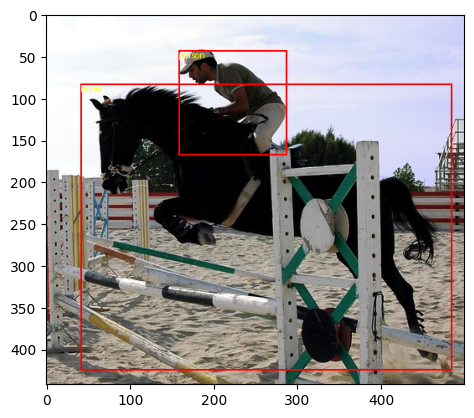

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


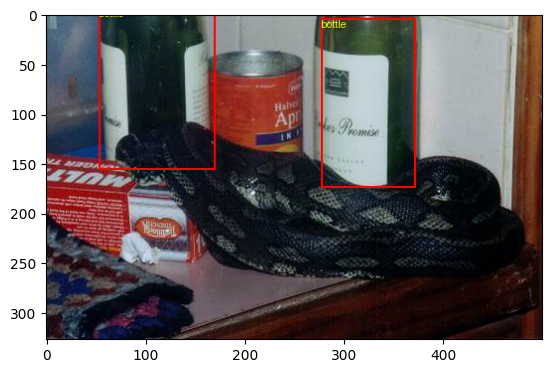

Number of bounding boxes before NMS: 3
Number of bounding boxes after NMS: 3


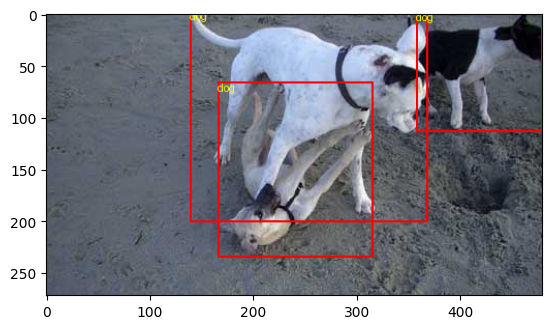

Number of bounding boxes before NMS: 5
Number of bounding boxes after NMS: 5


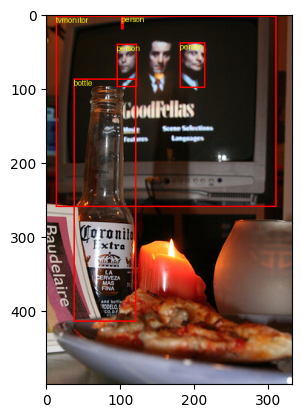

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


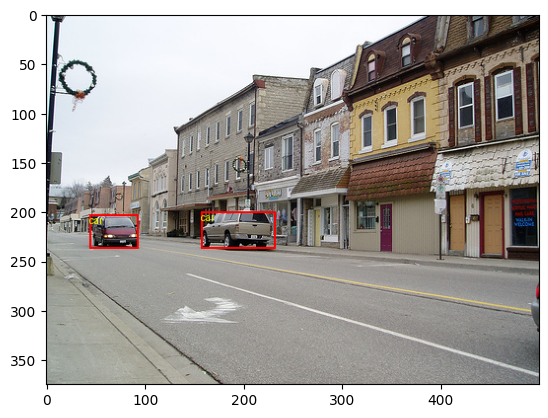

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


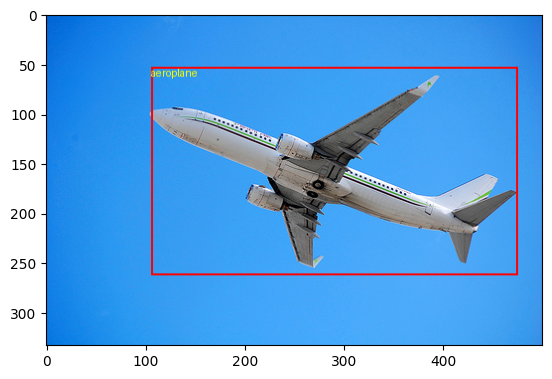

Number of bounding boxes before NMS: 6
Number of bounding boxes after NMS: 6


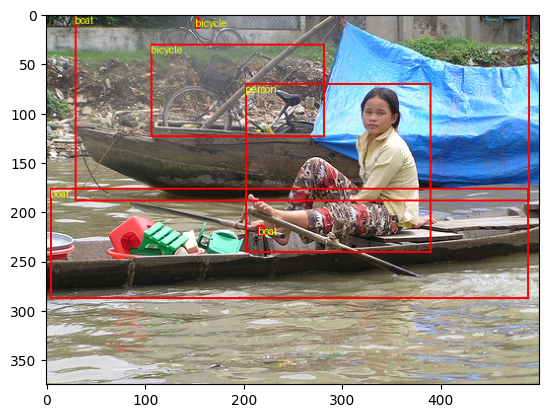

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


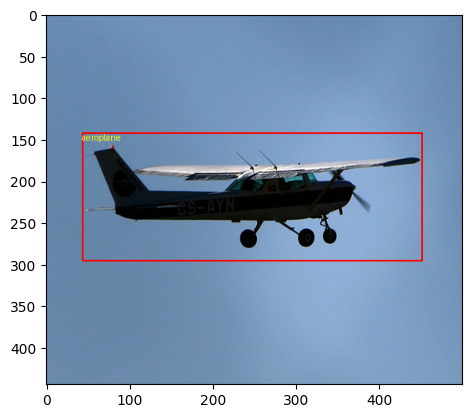

Number of bounding boxes before NMS: 9
Number of bounding boxes after NMS: 9


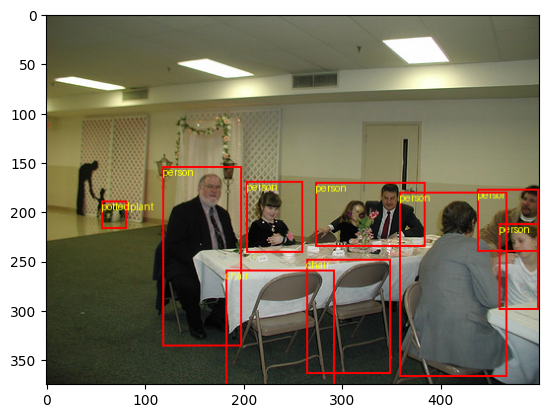

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


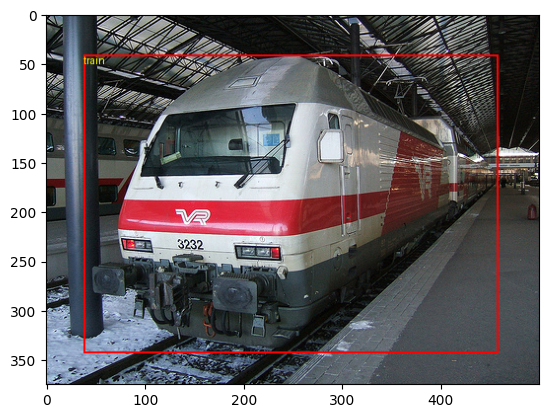

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


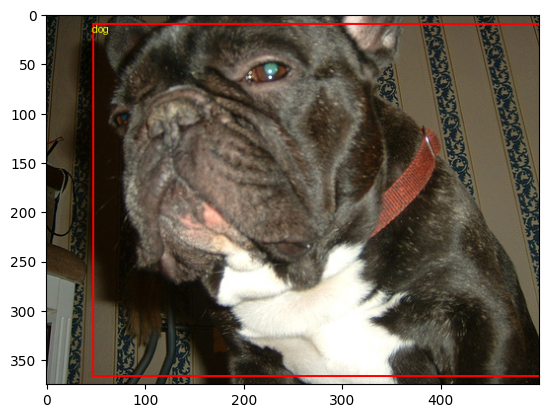

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


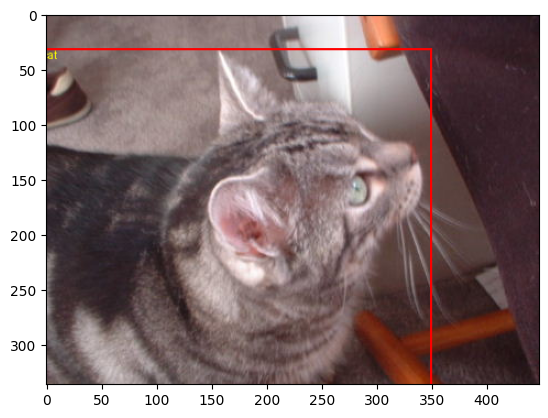

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


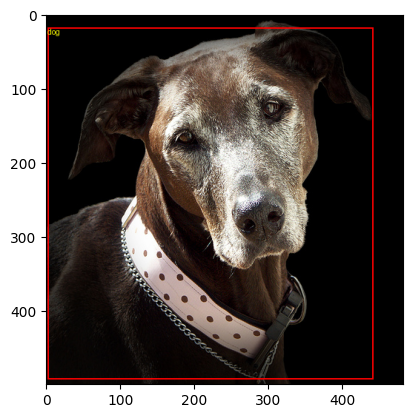

Number of bounding boxes before NMS: 3
Number of bounding boxes after NMS: 3


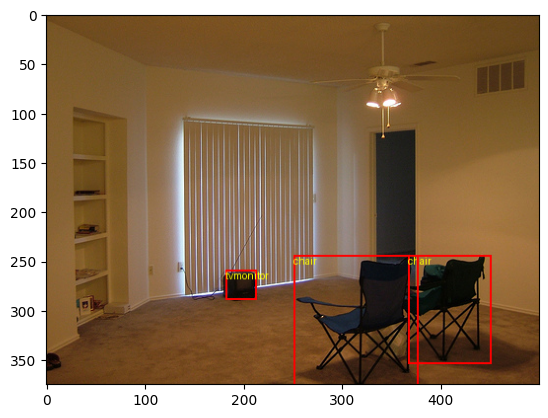

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


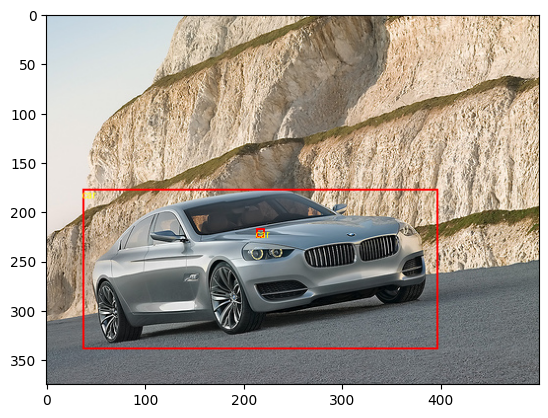

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


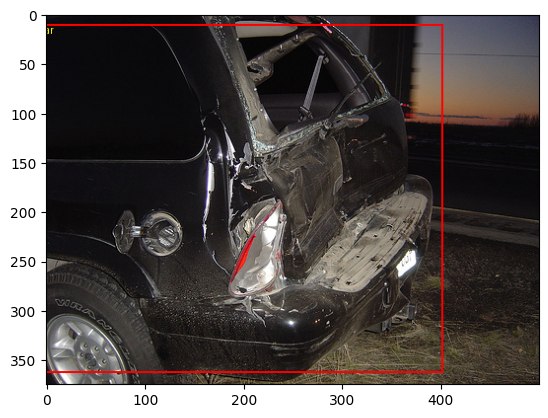

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


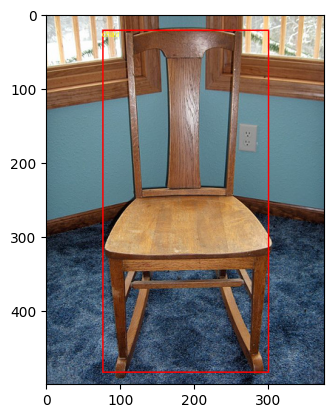

Number of bounding boxes before NMS: 3
Number of bounding boxes after NMS: 3


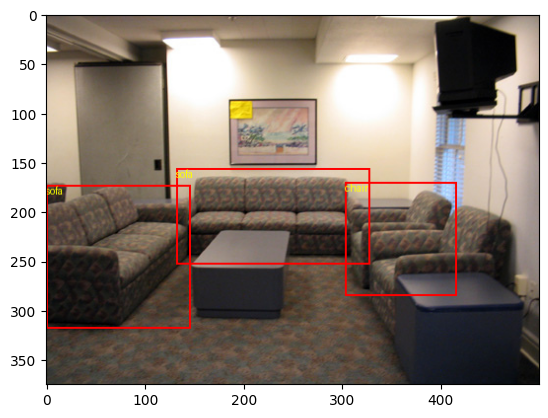

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


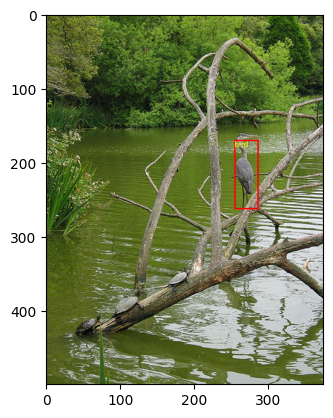

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


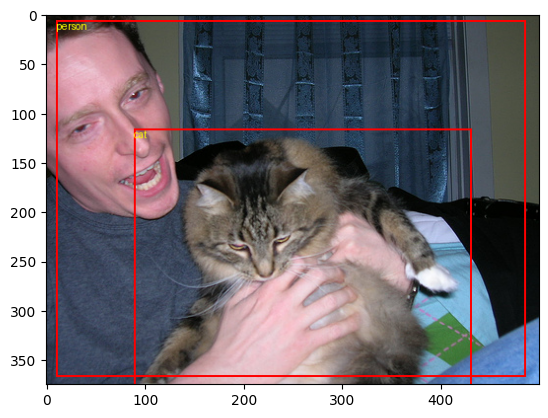

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


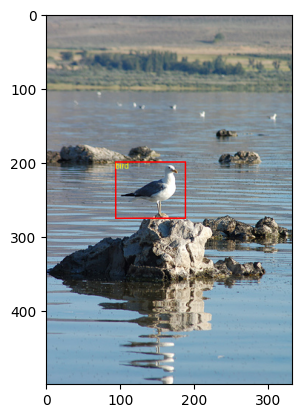

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


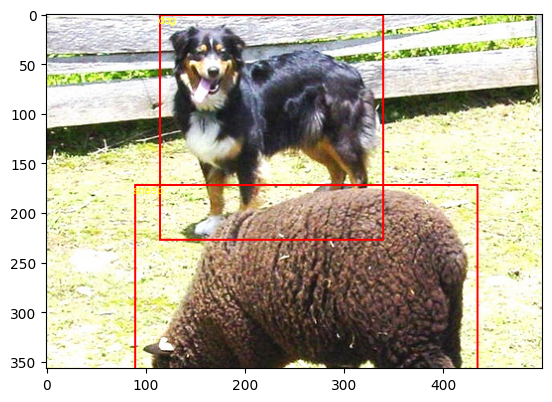

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


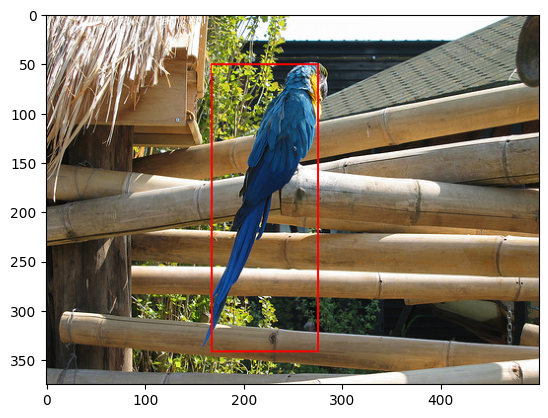

Number of bounding boxes before NMS: 1
Number of bounding boxes after NMS: 1


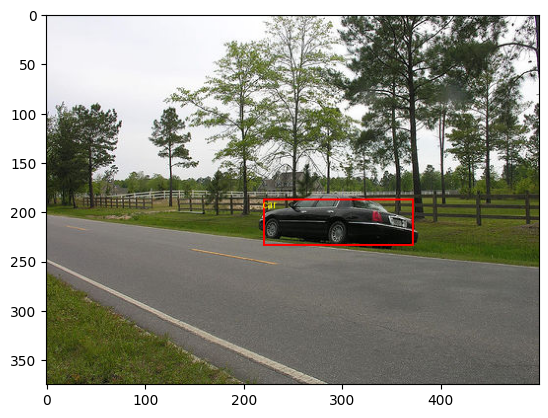

Number of bounding boxes before NMS: 2
Number of bounding boxes after NMS: 2


In [ ]:
import os
import torch
import torchvision
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
# from train import DEVICE
# from utils import load_checkpoint
# from train import transform

def test():
    check_point_path = "/content/drive/MyDrive/best_model.pth"

    if not os.path.exists(check_point_path):
        raise FileNotFoundError(f"Checkpoint not found at [{check_point_path}]")

    # Load mô hình
    model   = Yolov1(split_size=S, num_boxes=B, num_classes=C).to(DEVICE)
    model.eval()

    # Sử dụng hàm load_checkpoint để load trọng số
    model, _, _, _ = load_checkpoint(check_point_path, model, device=DEVICE, load_weights_only=True)
    print("Model weights loaded successfully for testing.")

    # load dataset to visualize and predict
    dataset = PascalVOC2012Dataset(root_dir=ROOT_DIR, split='trainval', transform=transform)

    # Truy xuất ngược lại để in tên trên bounding box3
    name2idx = get_class_dictionary(os.path.join(ROOT_DIR, 'ImageSets', 'Main'))
    idx2name = dict(zip([key for key in name2idx.values()], [value for value in name2idx.keys()]))

    for idx in range(dataset.__len__()):
        original_img, img, target = dataset.__getitem__(idx)
        img = img.unsqueeze(0).to('cuda')
        output = model(img)
        bboxes = []
        labels = []
        confs  = []
        factor = 1. / S
        W, H = original_img.size

        for i in range(S):
            for j in range(S):
                for k in range(B):
                    out  = output[0, i, j, k*5:k*5+5]
                    box  = out[:4]
                    conf = out[4]
                    cls  = output[0, i, j, B*5:]
                    a, b = torch.max(cls, dim=-1)
                    conf = a * conf
                    label = b
                    if (conf < 0.5):
                        continue
                    cx_cell = box[0]
                    cy_cell = box[1]
                    w       = box[2]
                    h       = box[3]

                    cx = (cx_cell + j) * factor
                    cy = (cy_cell + i) * factor

                    x1 = (cx - w/2)
                    y1 = (cy - h/2)
                    x2 = (cx + w/2)
                    y2 = (cy + h/2)

                    bboxes.append([x1, y1, x2, y2])
                    confs.append(conf)
                    labels.append(label)

        if len(bboxes) > 0:
            print(f"Number of bounding boxes before NMS: {len(bboxes)}")
            bboxes = torch.tensor(bboxes)
            confs  = torch.tensor(confs)
            labels = torch.tensor(labels)
            mask = torchvision.ops.nms(bboxes, confs, 0.5)

            bboxes = bboxes[mask]
            labels = labels[mask]

            print(f"Number of bounding boxes after NMS: {len(bboxes)}")
            draw = ImageDraw.Draw(original_img)
            font = ImageFont.load_default()

            for (box, label) in zip(bboxes, labels):
                x1 = int(box[0] * W)
                y1 = int(box[1] * H)
                x2 = int(box[2] * W)
                y2 = int(box[3] * H)

                # #print("box[0] {} and x1 {}, ".format(box[0], x1))
                # #print("box[1] {} and y1 {}, ".format(box[1], y1))
                # print("box[2] {} and x2 {}, ".format(box[2], x2))
                # print("box[3] {} and y2 {}, ".format(box[3], y2))

                draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)
                draw.text((x1, y1), idx2name[int(label.item())], font=font, fill='yellow')

            plt.imshow(original_img)
            plt.show()

    print("\nTesting completed!")

if __name__ == '__main__':
    test()
